# Week 7
## Overview

This week's curriculum focuses in figuring out (and visualizing) what's special about a certain text (or collection of texts). We'll also learn about community detection in networks (that's how we'll get our groups of text)

* Tricks for raw text (NLPP, Chapter 3).
* Community Detection and info-boxes 
* Identifying important words in a document (TF-IDF)

In the first part, we will take a quick tour of NLPP1e's chapter 3, which is boring, super useful ressource. Then we'll talk about how we can use simple statistics & machine learning to get text to show us what it's all about. We will even do a little visualization. 

In the latter parts we will go back to network science, discussing community detection, mixing in some NLP, and trying it all out on our very own dataset.


# Part 1: Processing real text (from out on the inter-webs)

Ok. So Chapter 3 in NLPP is all about working with text from the real world. Getting text from this internet, cleaning it, tokenizing, modifying (e.g. stemming, converting to lower case, etc) to get the text in shape to work with the NLTK tools you've already learned about - and many more. 

In the process we'll learn more about regular expressions, as well as unicode; something we've already been struggling with a little bit will now be explained in more detail. 

<div class="alert alert-block alert-info">
One of the things that the LLMs have changed is how we don't have to suffer over regular expressions as much as in the old days. As I talk about in the video, regular expressions used to be a big, painful part of working with text. Nowadays, we can simply ask an LLM to help construct them ... and it tends to work really well. And regular expressions are not really important to know about - you need to know they exist so you can used them, but the details are not worth remembering. So this is one area where you can use LLMs as much as you like without a guilty conscience. (But remember to check and test the results thoroughly! The LLMs might still make mistakes.)
</div>

> 
> **Video lecture**: Short overview of chapter 3 + a few words about kinds of language processing that we don't address in this class. 
> 

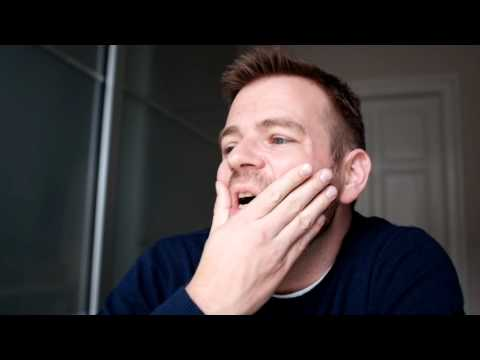

In [1]:
from IPython.display import YouTubeVideo
YouTubeVideo("Rwakh-HXPJk",width=800, height=450)

> *Reading*: NLPP Chapter 3.1, 3.2, 3.3, 3.4, 3.5, 3.6, 3.7, 3.9, and 3.10\. It's not important that you go in depth with everything here - the key think is that you *know that Chapter 3 of this book exists*, and that it's a great place to return to if you're ever in need of an explanation of regular expressions, unicode, or other topics that you forget as soon as you stop using them (and don't worry, I forget about those things too).
> 

# Part 2: Community detection

Let's begin by watching a lecture to learn about communities. If you want all the details, I recommend you take a look at _Chapter 9_ in the _Network Science_ book ... but the video lecture below should be enough to get you started. 

**Note**: For this and the next exercise, work on the _undirected_ version of the network.

> **_Video Lecture_**: Communities in networks. 

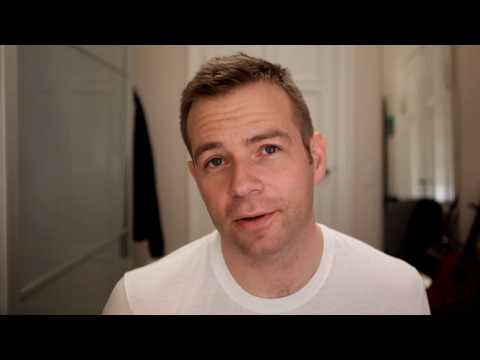

In [2]:
YouTubeVideo("FSRoqXw28RI",width=800, height=450)

# direct youtube link: https://www.youtube.com/watch?v=FSRoqXw28RI

Before we get started on *network* communities, we'll grab some information on a different kind of communities based on information from Wikipedia. Specifically, the ``infoboxes``. An infobox is the little box usually displayed on the right when you open an artist's page. 

For example if you open the page for [The Rolling Stones](https://en.wikipedia.org/wiki/The_Rolling_Stones), you'll see that it contains info about their place of ***origin***, the ***genre***s of music they've been associated with (in the case of the Stones it's `rock`, `pop` and `blues`), their ***year's active***, the record ***labels*** they've signed with over time, etc. All really interesting information if we want to understand the network of artists.

So let's start with an exercise designed to give you a sense of how good the LLMs are at the whole text-parsing thing.

*Exercise*: Go nuts with an LLM and get all the genres for the nodes in your network
> * Yes, I'm serious. For this one I'd like you to fire up your most powerful thinking model you have access to and get it to write a script to extract genre for all nodes in your network. Some notes to help you
>   * If the node doesn't have an `infobox` (or if a node's infobox doesn't have a `genre` it it), just don't assign that node a genre and ignore it in the downstream analysis
>   * Remember to lowercase all genres, also consider simplifying things by mapping `rock'n'roll`, `rock & roll`, etc to a single genre. 
>   * Remember to test your algorithm well before emplying it, since you're not writing the code yourself, you need to work harder to prove to yourself that it's actually doing what you think it's doing. You should inspect the code to understand what it's actually doing and also test it on the strangest edge-cases you can find. (Can it handle, "The Animals", for example).
>   * The output should be a dictionary mapping artist names to lists of genres (since most artists have multiple genres listed).
> * Report the following stats
>   * The number of nodes for which you could find genres
>   * The average number of genres per node
>   * The total number of distinct genres
>   * A histogram showing artist counts for the top 15 genres

<div class="alert alert-block alert-info">
LLMs all the way for this one. 
</div>

Artists with genres: 438
Average number of genres per artist: 4.02
Distinct genres: 396


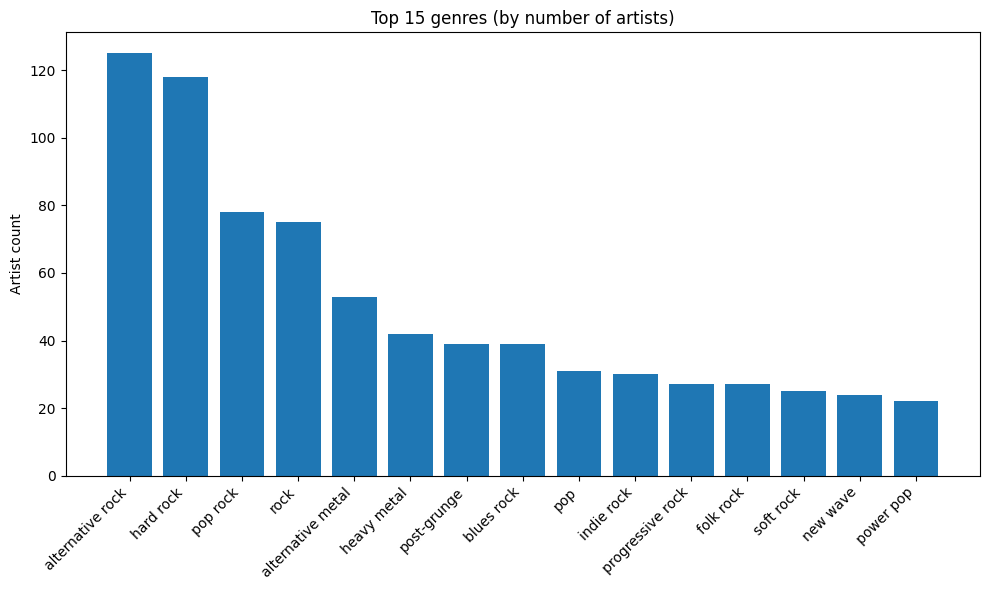

OrderedDict([('10 Years (band)',
              ['alternative metal',
               'progressive metal',
               'post-grunge',
               'nu metal']),
             ('10cc',
              ['art rock [ 1 ]',
               'art pop [ 2 ]',
               'progressive pop [ 3 ]',
               'soft rock [ 4 ]',
               'pop rock [ 5 ]']),
             ('311 (band)',
              ['alternative rock',
               'rap rock',
               'reggae rock',
               'funk rock',
               'funk metal']),
             ('38 Special (band)',
              ['hard rock',
               'southern rock',
               'boogie rock',
               'blues rock [ 1 ]']),
             ('3 Doors Down',
              ['post-grunge [ 1 ]',
               'hard rock [ 1 ]',
               'alternative rock [ 2 ]']),
             ('ABBA', ['pop', 'disco', 'pop rock [ 1 ]', 'europop [ 2 ]']),
             ('AFI (band)',
              ['punk rock',
               'gothic r

In [2]:
import os
import glob
import re
from collections import Counter, OrderedDict
from statistics import mean
from bs4 import BeautifulSoup

# Parse artist HTML files and extract genres from the infobox according to the specified structure.
import matplotlib.pyplot as plt

def normalize_genre(g):
    g = g.strip().lower()
    # remove parenthetical comments
    g = re.sub(r"\s*\(.*?\)\s*", "", g)
    # unify various "rock'n'roll" variants to "rock and roll"
    g = re.sub(r"rock\s*['`’]?\s*n\s*['`’]?\s*roll", "rock and roll", g)
    g = re.sub(r"rock\s*&\s*roll", "rock and roll", g)
    g = re.sub(r"rock\s+and\s+roll", "rock and roll", g)
    # replace ampersand with "and"
    g = re.sub(r"&", "and", g)
    # collapse whitespace and strip punctuation at ends
    g = re.sub(r"\s+", " ", g).strip(" ,;:.")
    return g

def get_artist_name(soup, filepath):
    # try common Wikipedia heading
    h = soup.find(id="firstHeading")
    if h and h.get_text(strip=True):
        return h.get_text(strip=True)
    # fallback to title tag
    t = soup.find("title")
    if t and t.get_text(strip=True):
        title = t.get_text(strip=True)
        # often "Artist - Wikipedia"
        return re.sub(r"\s*-\s*Wikipedia.*$", "", title).strip()
    # fallback to filename
    return os.path.splitext(os.path.basename(filepath))[0]

genres_by_artist = OrderedDict()

files = glob.glob("../Week4/content/**/*.txt", recursive=True)
for fp in sorted(files):
    try:
        with open(fp, "r", encoding="utf-8") as f:
            html = f.read()
    except Exception:
        # try latin-1 if utf-8 fails
        with open(fp, "r", encoding="latin-1") as f:
            html = f.read()
    soup = BeautifulSoup(html, "html.parser")

    # find the infobox table with the exact class (may have multiple classes)
    table = None
    for tbl in soup.find_all("table", class_=True):
        classes = tbl.get("class", [])
        if "infobox" in classes and "vcard" in classes and "plainlist" in classes:
            table = tbl
            break

    artist = get_artist_name(soup, fp)
    found_genres = []

    if table:
        # find tr where th has class 'infobox-label' and text = 'Genres' (or 'Genre')
        for tr in table.find_all("tr"):
            th = tr.find("th", class_="infobox-label")
            if not th:
                continue
            label = th.get_text(strip=True).lower()
            if label in ("genres", "genre"):
                td = tr.find("td", class_="infobox-data")
                if not td:
                    continue
                # per instruction: genres located in li elements under ul under div.hlist under td.infobox-data
                div = td.find("div", class_="hlist")
                if div:
                    ul = div.find("ul")
                    if ul:
                        for li in ul.find_all("li"):
                            text = li.get_text(" ", strip=True)
                            if text:
                                # sometimes li contains comma-separated items; split conservatively
                                parts = [p.strip() for p in re.split(r"/|,|;| and | \| ", text) if p.strip()]
                                for p in parts:
                                    ng = normalize_genre(p)
                                    if ng:
                                        found_genres.append(ng)
                # if above structure not present, fallback to extracting any links or text in td
                if not found_genres:
                    # gather anchor texts under td
                    anchors = td.find_all("a")
                    if anchors:
                        for a in anchors:
                            text = a.get_text(strip=True)
                            if text:
                                ng = normalize_genre(text)
                                if ng:
                                    found_genres.append(ng)
                    else:
                        # fallback to raw td text splitting on commas
                        raw = td.get_text(" ", strip=True)
                        for p in [x.strip() for x in re.split(r",|/|;|\|| and ", raw) if x.strip()]:
                            ng = normalize_genre(p)
                            if ng:
                                found_genres.append(ng)
                break  # stop after finding the Genres row

    # deduplicate while preserving order
    seen = set()
    uniq = []
    for g in found_genres:
        if g not in seen:
            seen.add(g)
            uniq.append(g)
    if uniq:
        genres_by_artist[artist] = uniq

# Stats
num_artists_with_genres = len(genres_by_artist)
avg_genres_per_artist = mean(len(v) for v in genres_by_artist.values()) if genres_by_artist else 0
all_genres = Counter(g for genres in genres_by_artist.values() for g in genres)
num_distinct_genres = len(all_genres)

print(f"Artists with genres: {num_artists_with_genres}")
print(f"Average number of genres per artist: {avg_genres_per_artist:.2f}")
print(f"Distinct genres: {num_distinct_genres}")

# Top 15 genres histogram
top_n = 15
top = all_genres.most_common(top_n)
genres, counts = zip(*top) if top else ([], [])

plt.figure(figsize=(10,6))
plt.bar(range(len(genres)), counts, color="C0")
plt.xticks(range(len(genres)), genres, rotation=45, ha="right")
plt.ylabel("Artist count")
plt.title(f"Top {top_n} genres (by number of artists)")
plt.tight_layout()
plt.show()

# expose the dictionary for later cells
genres_by_artist  # variable available in notebook

Now that we have the genres, let's use them - and see how community-like the community is, if we consider the genres to be community labels.


*Exercise*: Use the concept of modularity to explore how _community-like_ the genres are.
> 
> * Explain the concept of modularity in your own words.
> * Work from the undirected version of the network, keeping only the nodes for which you have genre information. 
> * Now create your own partition of the network into genres.
>      * **Each node is simply characterized by the *first genre* in its list of genres**.
>      * Each community is the group of nodes that share the same genre.
>      * That's all you need, now calculate the modularity of this division of the network into genres.
>      * **Note**: Modularity is described in the _Network Science_ book, section 9.4.. Thus, use **equation 9.12** in the book to calculate the modularity $M$ of the partition described above. Are the genres good communities?
> * Thinking a bit about the underlying data, a potential issue is the following: Many artists have the genre `rock` as their first genre in the list (since we started from a list of `rock` bands). So if `rock` is a big community, the network won't have very high modularity.
>      * What happens to the modularity if you use a random genre from the list genre as the node-label for those nodes with more than one genre listed?
> * Discuss your findings - and decide how you want to settle on a single genre for each band.  

<div class="alert alert-block alert-info">
Overall, it's OK to use an LLM to help with the code here. But do write your own explanation of modularity, and do try to implement a modularity on your own from eq 9.12 in the book.
</div>

In [5]:
import networkx as nx
import random
import statistics

# Modularities of genre-based partitions (new cell)

G = nx.read_gexf('/Users/tzikos/Desktop/DTU/3rd Semester/Social graphs & interactions/Week4/rock_performers_graph.gexf')

# genres_by_artist is defined in a previous cell (from the scraping step)
if "genres_by_artist" not in globals():
    raise RuntimeError("genres_by_artist not found. Run the previous cell that builds genres_by_artist.")

# Attempt robust name matching from artist keys to graph node names (case-insensitive)
artist_to_node = {}
nodes_by_lower = {str(n).lower(): n for n in G.nodes()}
for artist in genres_by_artist.keys():
    a_low = artist.lower()
    if artist in G:
        artist_to_node[artist] = artist  # exact match
    elif a_low in nodes_by_lower:
        artist_to_node[artist] = nodes_by_lower[a_low]
    else:
        # try relaxed matching: compare normalized whitespace/underscores
        norm = a_low.replace("_", " ").strip()
        matched = None
        for node in G.nodes():
            node_norm = str(node).lower().replace("_", " ").strip()
            if node_norm == norm:
                matched = node
                break
        if matched:
            artist_to_node[artist] = matched

matched = {a: artist_to_node[a] for a in artist_to_node}
unmatched_count = len(genres_by_artist) - len(matched)
print(f"Artists with genre info: {len(genres_by_artist)}; matched to nodes in graph: {len(matched)}; unmatched: {unmatched_count}")

# Build the subgraph containing only nodes for which we have genre info and were matched
mapped_nodes = set(matched.values())
H = G.subgraph(mapped_nodes).copy()
m = H.number_of_edges()
if m == 0:
    raise RuntimeError("Subgraph has zero edges; cannot compute modularity.")

# helper: compute modularity from communities (communities: iterable of node lists)
def modularity_from_communities(G_in, communities):
    m_edges = G_in.number_of_edges()
    if m_edges == 0:
        return 0.0
    Q = 0.0
    for C in communities:
        L_c = G_in.subgraph(C).number_of_edges()             # internal edges
        D_c = sum(dict(G_in.degree(C)).values())             # sum of degrees (in G_in)
        Q += (L_c / m_edges) - (D_c / (2 * m_edges)) ** 2
    return Q

# Partition 1: first-genre for each artist -> community labels
node_to_artist = {v: k for k, v in matched.items()}
partition_first = {}
for node in H.nodes():
    artist = node_to_artist[node]
    first_genre = genres_by_artist[artist][0]  # guaranteed by scraping to be lowercased/normalized
    partition_first.setdefault(first_genre, []).append(node)

Q_first = modularity_from_communities(H, partition_first.values())
print(f"Modularity (first-genre partition): {Q_first:.4f}")
print(f"Number of genre-communities (non-empty): {len(partition_first)}")

# Partition 2: random-genre assignment for multi-genre artists — repeat and report mean+std
def random_genre_partition(mapping_matched, genres_map, graph_H, seed=None):
    rnd = random.Random(seed)
    part = {}
    for node in graph_H.nodes():
        artist = node_to_artist[node]
        choices = genres_map[artist]
        chosen = rnd.choice(choices)
        part.setdefault(chosen, []).append(node)
    return part

trials = 50
qs = []
for t in range(trials):
    part_rand = random_genre_partition(matched, genres_by_artist, H, seed=t)
    qs.append(modularity_from_communities(H, part_rand.values()))
mean_q = statistics.mean(qs)
stdev_q = statistics.pstdev(qs)
print(f"Random-genre assignment over {trials} trials -> mean modularity: {mean_q:.4f}, std: {stdev_q:.4f}")

# Additionally: show top genres used and sizes for first-genre partition
sizes = sorted([(g, len(nodes)) for g, nodes in partition_first.items()], key=lambda x: -x[1])[:15]
print("Top genre community sizes (first-genre):")
for g, s in sizes:
    print(f"  {g}: {s}")

# Save results into notebook variables for later use
_modularity_genres_first = Q_first
_modularity_genres_random_mean = mean_q
_modularity_genres_random_std = stdev_q
_partition_first_by_genre = partition_first
_random_modularity_samples = qs

Artists with genre info: 438; matched to nodes in graph: 408; unmatched: 30
Modularity (first-genre partition): 0.0658
Number of genre-communities (non-empty): 108
Random-genre assignment over 50 trials -> mean modularity: 0.0221, std: 0.0030
Top genre community sizes (first-genre):
  rock: 57
  alternative rock: 55
  hard rock: 40
  heavy metal: 13
  alternative metal: 12
  progressive rock: 11
  pop rock: 10
  indie rock: 10
  punk rock: 9
  post-grunge: 9
  pop-punk: 7
  new wave: 7
  blues rock: 6
  alternative rock [ 1 ]: 5
  southern rock: 5


*Exercise*: Community detection to find **structral communities** in the network
> * Again, work only with the subnetwork of nodes that have at least one genre.
> * Use [the Louvain-algorithm](https://networkx.org/documentation/stable/reference/algorithms/generated/networkx.algorithms.community.louvain.louvain_communities.html) to find communities for the network. Report the value of modularity found by the algorithm. 
>     * **Note**: You can also try the *Infomap* algorithm instead if you're curious. Go to http://www.mapequation.org/code.html and search for 'python'. It's harder to install, but a better community detection algorithm.
> * What is the modularity of this partitioning of the network? Is it more community-like than the genres? What does this comparison reveal about the communities?
> * Visualize the network, using the Force Atlas algorithm.
>     * This time assign each node a different color based on its structural _community_.
>     * **Note**: If there's a lot of small communities, it's OK to only color the 5-10 largest communities (you can make the remaing nodes light gray or some netural color)
>     * Describe the structure you observe.
> * Keep using the community labels from above, but now visualize only the backbone-edges from your favorite network backbone from last week. Do the community correspond to the backbone structure you detected?

<div class="alert alert-block alert-info">
It's OK to use an LLM to help with the code here. 
</div>

Louvain modularity: 0.3167
Genre (first-genre) modularity: 0.0658
Louvain partition is more community-like (higher modularity) than genres.
Layout: ForceAtlas2 (fa2) used.


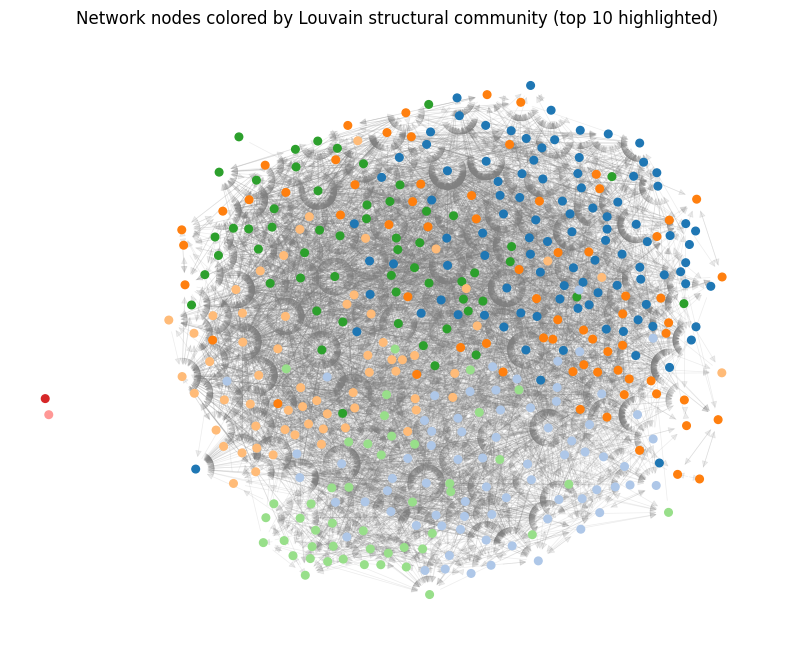

Backbone edges: 405 (nodes: 408)


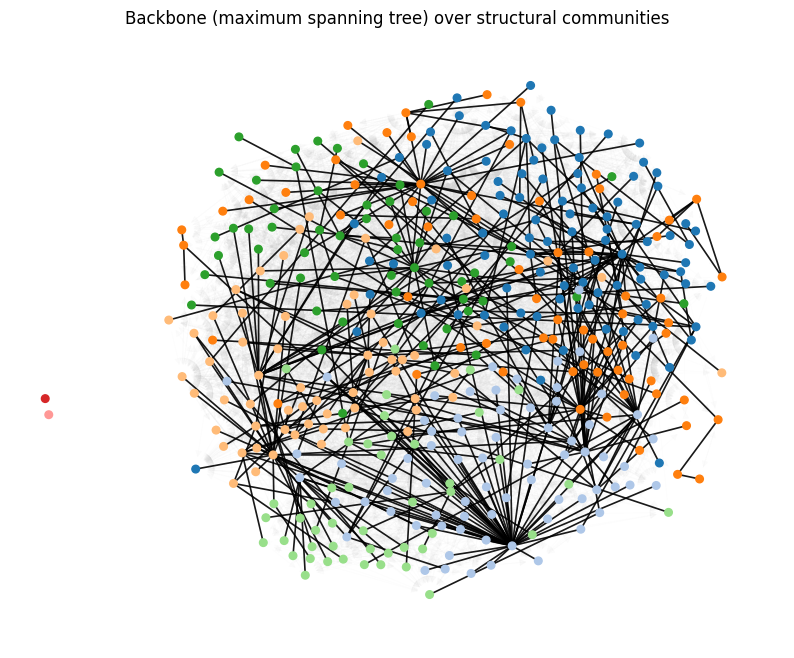

Number of Louvain communities: 8
Sizes of top communities: [100, 72, 69, 62, 57, 46, 1, 1]

Interpretation hints:
- Higher Louvain modularity compared to genre modularity suggests structural communities align better with graph topology.
- If genre modularity is similar or higher, genres may already capture dense groups in the network.
- Backbone (spanning tree) highlights key bridging edges; check whether backbone edges connect different colored communities (bridges) or stay within communities (intra-community backbones).


In [13]:
from collections import Counter
from networkx.algorithms.community import louvain_communities
from networkx import forceatlas2_layout
import networkx as nx

# Louvain structural communities, modularity, ForceAtlas (or fallback) visualization, and backbone view.
# Relies on notebook variables defined elsewhere: H, modularity_from_communities, _modularity_genres_first

import matplotlib.pyplot as plt

# 1) compute Louvain communities (try networkx implementation, fallback to python-louvain)
try:
    louvain_comms = louvain_communities(H, resolution=1, seed=42)
except Exception:
    try:
        import community as community_louvain  # python-louvain
        part = community_louvain.best_partition(H)
        tmp = {}
        for n, c in part.items():
            tmp.setdefault(c, []).append(n)
        louvain_comms = list(tmp.values())
    except Exception as e:
        raise RuntimeError("Louvain community detection not available: " + str(e))

# 2) modularity of Louvain partition (using provided helper)
Q_louvain = modularity_from_communities(H, louvain_comms)
print(f"Louvain modularity: {Q_louvain:.4f}")

# compare to genre-based modularity if available
if "_modularity_genres_first" in globals():
    Q_genre = _modularity_genres_first
    print(f"Genre (first-genre) modularity: {Q_genre:.4f}")
    if Q_louvain > Q_genre:
        print("Louvain partition is more community-like (higher modularity) than genres.")
    elif Q_louvain < Q_genre:
        print("Genres produce higher modularity than Louvain partition.")
    else:
        print("Modularity is equal for Louvain and genre partition (within numerical precision).")
else:
    print("Genre modularity not found in notebook variables; skipping comparison.")

# 3) prepare coloring for visualization: color top K largest communities, rest gray
comm_sizes = sorted([(i, len(c)) for i, c in enumerate(louvain_comms)], key=lambda x: -x[1])
top_k = 10
top_comm_idxs = [i for i, _ in comm_sizes[:top_k]]

node_to_comm = {}
for idx, comm in enumerate(louvain_comms):
    for n in comm:
        node_to_comm[n] = idx

# map nodes to colors
cmap = plt.get_cmap("tab20")
colors = {}
for i, comm_idx in enumerate(top_comm_idxs):
    colors[comm_idx] = cmap(i % 20)
# default color for small communities
default_color = (0.8, 0.8, 0.8)

node_colors = [colors.get(node_to_comm.get(n, None), default_color) for n in H.nodes()]

# 4) compute layout: use forceatlas2_layout imported from networkx if available, else spring_layout
pos = None
try:
    pos = forceatlas2_layout(
                                H, 
                                pos=None, 
                                max_iter=2000, 
                                gravity=0.3, 
                                strong_gravity=True, 
                                jitter_tolerance=0.5,
                                seed=42
    )
    print("Layout: ForceAtlas2 (fa2) used.")
except Exception:
    pos = nx.spring_layout(H, seed=42, k=0.1, iterations=200)
    print("Layout: networkx spring_layout used (ForceAtlas2 unavailable).")

# 5) draw full network colored by community (highlighting top K communities)
plt.figure(figsize=(10, 8))
# draw edges faintly
nx.draw_networkx_edges(H, pos, alpha=0.15, edge_color="gray", width=0.5)
# draw nodes
nx.draw_networkx_nodes(H, pos,
                       node_color=node_colors,
                       node_size=30)
plt.axis('off')
plt.title(f"Network nodes colored by Louvain structural community (top {top_k} highlighted)")
plt.show()

# 6) backbone: try maximum spanning tree (if weights exist, uses 'weight'; otherwise unweighted)
try:
    # ensure we operate on an undirected simple Graph
    if H.is_directed():
        G = H.to_undirected(reciprocal=False)
    else:
        G = H.copy()

    # If it's a MultiGraph, collapse multiple edges into a simple Graph,
    # keeping the maximum weight when present (fallback weight=1.0).
    if G.is_multigraph():
        G_simple = nx.Graph()
        for u, v, data in G.edges(data=True):
            w = data.get('weight', 1.0)
            if G_simple.has_edge(u, v):
                if w > G_simple[u][v].get('weight', float('-inf')):
                    G_simple[u][v]['weight'] = w
            else:
                attr = dict(data)
                attr['weight'] = w
                G_simple.add_edge(u, v, **attr)
        G = G_simple

    # compute maximum spanning tree on the undirected Graph
    if any('weight' in d for _, _, d in G.edges(data=True)):
        backbone = nx.maximum_spanning_tree(G, weight='weight')
    else:
        backbone = nx.maximum_spanning_tree(G)  # unweighted
    print(f"Backbone edges: {backbone.number_of_edges()} (nodes: {backbone.number_of_nodes()})")
except Exception as e:
    backbone = None
    print("Could not compute backbone spanning tree:", e)

# 7) visualize backbone over colored nodes
plt.figure(figsize=(10, 8))
# draw all nodes lightly
nx.draw_networkx_nodes(H, pos, node_color=node_colors, node_size=30)
# draw full network faint edges
nx.draw_networkx_edges(H, pos, alpha=0.05, edge_color="lightgray", width=0.5)
# overlay backbone edges thicker and darker if available
if backbone is not None:
    nx.draw_networkx_edges(backbone, pos, edge_color="black", width=1.2, alpha=0.9)
    plt.title("Backbone (maximum spanning tree) over structural communities")
else:
    plt.title("Backbone unavailable — showing full network colored by community")
plt.axis('off')
plt.show()

# 8) short quantitative summary of communities
num_comms = len(louvain_comms)
sizes = sorted([len(c) for c in louvain_comms], reverse=True)
print(f"Number of Louvain communities: {num_comms}")
print(f"Sizes of top communities: {sizes[:10]}")

# 9) brief suggested interpretation (printed)
print("\nInterpretation hints:")
print("- Higher Louvain modularity compared to genre modularity suggests structural communities align better with graph topology.")
print("- If genre modularity is similar or higher, genres may already capture dense groups in the network.")
print("- Backbone (spanning tree) highlights key bridging edges; check whether backbone edges connect different colored communities (bridges) or stay within communities (intra-community backbones).")

Ok, now in this final community exercise, we want to check if the genres align with the communities.


> *Exercise*: Communities versus genres.
> * Compare the communities found by your algorithm with the music genres by creating a matrix $D$ with dimension ($G \times C$), where G is the 7 most common genres and C is the 7 most common communities. We set entry $D(i,j)$ to be the number of nodes that genre $i$ has in common with community $j$. The matrix $D$ is what we call a confusion matrix.
> * Use the confusion matrix to explain how well the communities you've detected correspond to the genres.
>     * **Note**: This time, use all the genres associate with each node
>     * **Note**: If a node is not characterized by any of the 7 most popular genres, just ignore it.
>     * **Note**: If a node is not part of by any of the 7 largest communiteis, just ignore it.

<div class="alert alert-block alert-info">
Again, you may use an LLM to help with the code for this assignment. The main thing is you get the D matrix right and interpret it.
</div>

Top 7 genres (rows): ['alternative rock', 'hard rock', 'pop rock', 'rock', 'alternative metal', 'heavy metal', 'post-grunge']
Top 7 structural communities sizes (cols): [100, 72, 69, 62, 57, 46, 1]

Confusion matrix D (rows=genres, cols=communities):

[[11  7  1 46 27 27  0]
 [10 36 17  8  6 32  0]
 [11  4 18 18 14  7  0]
 [36  3 16  4 10  1  0]
 [ 0 22  0  6  1 23  0]
 [ 2 28  1  0  1  4  0]
 [ 0  2  0  6  2 28  0]]


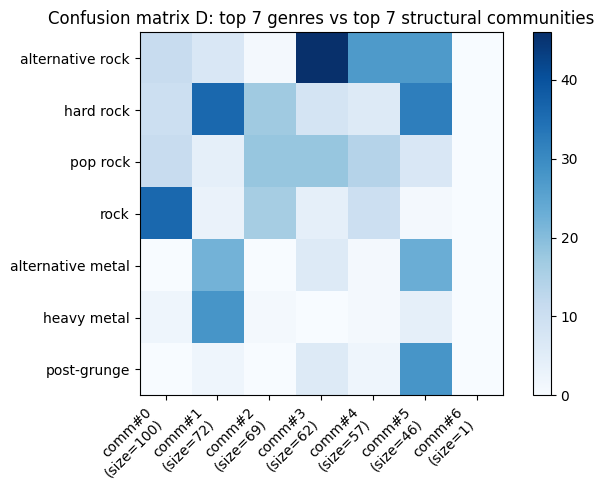

In [7]:
from collections import Counter, defaultdict
import numpy as np
from networkx.algorithms.community import louvain_communities

# Compare Louvain structural communities with top genres -> confusion matrix D (7x7)
# Relies on notebook variables: H, genres_by_artist, node_to_artist (from earlier cells)

import matplotlib.pyplot as plt

# 1) obtain Louvain communities (try networkx implementation, fallback to python-louvain)
try:
    comms_all = louvain_communities(H, resolution=1, seed=42)
except Exception:
    try:
        import community as community_louvain  # python-louvain
        part = community_louvain.best_partition(H)
        tmp = defaultdict(list)
        for n, c in part.items():
            tmp[c].append(n)
        comms_all = list(tmp.values())
    except Exception as e:
        raise RuntimeError("Louvain community detection not available: " + str(e))

# 2) take the 7 largest structural communities
comms_sorted = sorted(comms_all, key=len, reverse=True)
topC = 7
top_comms = [list(c) for c in comms_sorted[:topC]]
comm_sizes = [len(c) for c in top_comms]

# 3) determine the 7 most common genres (from earlier 'all_genres' / 'top' if present)
try:
    top_genres_list = [g for g, _ in top[:7]]
except Exception:
    # compute from genres_by_artist if 'top' not present
    allg = Counter(g for genres in genres_by_artist.values() for g in genres)
    top_genres_list = [g for g, _ in allg.most_common(7)]

G = len(top_genres_list)
C = len(top_comms)

# 4) build maps for quick lookup
genre_to_row = {g: i for i, g in enumerate(top_genres_list)}
node_to_commidx = {}
for j, comm in enumerate(top_comms):
    for n in comm:
        node_to_commidx[n] = j

# 5) build confusion matrix D (G x C)
D = np.zeros((G, C), dtype=int)

for node in H.nodes():
    # only consider nodes that are in one of the top C communities
    if node not in node_to_commidx:
        continue
    comm_idx = node_to_commidx[node]

    # map node -> artist name -> genres
    artist = node_to_artist.get(node)
    if artist is None:
        continue
    genres = genres_by_artist.get(artist, [])
    # consider all genres associated with the node; ignore node if none in top genres
    intersect = [g for g in genres if g in genre_to_row]
    if not intersect:
        continue
    for g in intersect:
        D[genre_to_row[g], comm_idx] += 1

# 6) display results
print("Top 7 genres (rows):", top_genres_list)
print("Top 7 structural communities sizes (cols):", comm_sizes)
print("\nConfusion matrix D (rows=genres, cols=communities):\n")
print(D)

# 7) visualize as heatmap
plt.figure(figsize=(8,5))
im = plt.imshow(D, cmap="Blues", interpolation="nearest")
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xticks(range(C), [f"comm#{i}\n(size={s})" for i, s in enumerate(comm_sizes)], rotation=45, ha="right")
plt.yticks(range(G), top_genres_list)
plt.title("Confusion matrix D: top 7 genres vs top 7 structural communities")
plt.tight_layout()
plt.show()

# expose for later cells
D_confusion = D
_top_genres_7 = top_genres_list
_top_comms_7 = top_comms

# Part 3: Words that characterize pages or groups of pages

Now, we'll begin to play around with how far we can get with simple strategies for looking at text. 

The video is basically just me talking about a fun paper, which shows you how little is needed in order to reveal something highly interesting about humans that produce text. But it's important. Don't miss this one!

> **Video lecture**: Simple methods reveal a lot. I talk about the paper: [Personality, Gender, and Age in the Language of Social Media: The Open-Vocabulary Approach](http://journals.plos.org/plosone/article?id=10.1371/journal.pone.0073791).  

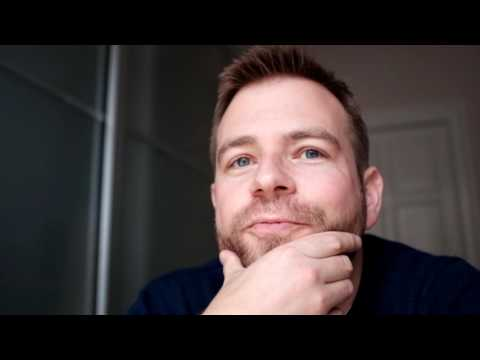

In [3]:
YouTubeVideo("wkYvdfkVmlI",width=800, height=450)

# direct youtube link: https://www.youtube.com/watch?v=wkYvdfkVmlI

_Exercise_: Comparing in the different genres. 

*Setup*. You'll need to go to your archives and find the wikipedia pages of all the rock artists. 

Once you have the texts ready, you will want to aggregate the text into 15 long lists, one for each of the top 15 genres (let's call them 15 *documents*). Each document contains on all the text in that genre (so for the rock genre it's a looooong big doc). In each list, you should keep all the words (or *tokens* to be more precise) that occur on the pages, and a count of how frequently each word occurs. So the format should be

```
word0 count0
word1 count1
word2 count2

...

wordN countN
```
This list is called a ***Term Frequency*** (or TF) list for each genre. Let's build our own TF lists. Before you start counting, I am going to ask you do do a few things

> *Action items*
> * Tokenize the pages into one long string per genre
> * Remove all punctuation from your list of tokens
> * Set everything to lower case
> * (Optional) Lemmatize your words
> * It's a good idea to filter out rare words (e.g. words that only appear less than 5 times).

If you are confused by the instructions for cleaning, go back and have a look at Chapter 3 again. You need to use the tools from the book to clean the text.

> *Action item*: 
> * Create your TF list for each of the 15 most popular genres.
> * List the top 15 words for each genre.
> * Comment on the top 15 words for each genre.

**Note**: Above you (once again) have to deal with the fact that many artists have multiple genres listed. Pick the method you like the best to deal with this. Some possible choices
* Counting each page multiple times, so a page counts once per genre that's listed
* Picking the first genre listed
* Picking the second genre listed
* Picking a random genre
* (... any other heuristic you like, e.g. using an api to ask an LLM to pick the genre that best describes the page from its list)

<div class="alert alert-block alert-info">
It's OK to use an LLM to help with the code here, but write your own comments.
</div>

In [21]:
from tqdm.auto import tqdm
import glob
import re
from bs4 import BeautifulSoup
from collections import Counter, defaultdict
import string
import nltk
from nltk.stem import WordNetLemmatizer, PorterStemmer
from nltk import pos_tag
from nltk.corpus import wordnet

# ensure required NLTK data is available
for pkg in ("wordnet", "omw-1.4", "averaged_perceptron_tagger"):
    try:
        nltk.data.find(f"corpora/{pkg}" if pkg.startswith("wordnet") or pkg.startswith("omw") else f"taggers/{pkg}")
    except LookupError:
        nltk.download(pkg)

# --- Setup NLTK stopwords ---
try:
    from nltk.corpus import stopwords
    stop_words = set(stopwords.words("english"))
except LookupError:
    nltk.download("stopwords")
    from nltk.corpus import stopwords
    stop_words = set(stopwords.words("english"))

# stemmer & lemmatizer
lemmatizer = WordNetLemmatizer()
stemmer = PorterStemmer()

def _wn_pos(tag):
    if tag.startswith("J"):
        return wordnet.ADJ
    if tag.startswith("V"):
        return wordnet.VERB
    if tag.startswith("R"):
        return wordnet.ADV
    return wordnet.NOUN

def tokenize_text(html_text):
    """Extract and clean text from HTML, remove stopwords, then lemmatize+stem tokens."""
    soup = BeautifulSoup(html_text, "html.parser")
    # remove reference lists from the page so their text isn't included
    for ref in soup.find_all("div", class_="reflist"):
        ref.decompose()
    text = soup.get_text(separator=" ")
    text = text.lower()
    text = re.sub(f"[{re.escape(string.punctuation)}]", " ", text)  # remove punctuation
    tokens = re.findall(r"\b[a-z]+\b", text)  # keep only alphabetic words
    # remove stopwords
    tokens = [t for t in tokens if t not in stop_words]
    # POS tag, lemmatize with POS, then stem
    try:
        tagged = pos_tag(tokens)
        lemmed = [lemmatizer.lemmatize(tok, _wn_pos(tag)) for tok, tag in tagged]
    except Exception:
        # fallback: lemmatize without POS if tagging fails
        lemmed = [lemmatizer.lemmatize(tok) for tok in tokens]
    stemmed = [stemmer.stem(w) for w in lemmed]
    return stemmed

# --- Aggregate tokens per genre ---
genre_tokens = defaultdict(list)

files = glob.glob("../Week4/content/**/*.txt", recursive=True)
for fp in tqdm(files, desc="Processing files"):
    try:
        with open(fp, "r", encoding="utf-8") as f:
            html = f.read()
    except Exception:
        with open(fp, "r", encoding="latin-1") as f:
            html = f.read()
    soup = BeautifulSoup(html, "html.parser")
    
    # get artist name and genres (as in your previous code)
    title = soup.find(id="firstHeading")
    if title:
        artist_name = title.get_text(strip=True)
    else:
        artist_name = re.sub(r"- Wikipedia.*$", "", soup.title.string if soup.title else fp)
        artist_name = artist_name.strip()
    
    if artist_name not in genres_by_artist:
        continue  # skip artists without genre info
    
    tokens = tokenize_text(html)
    
    # count each page once for each of its genres
    for g in genres_by_artist[artist_name]:
        genre_tokens[g].extend(tokens)

# --- Compute term frequencies per genre ---
genre_tf = {}
for genre, tokens in tqdm(list(genre_tokens.items()), desc="Counting genres"):
    counts = Counter(tokens)
    # filter rare words (<5 occurrences)
    filtered = {w: c for w, c in counts.items() if c >= 5}
    genre_tf[genre] = filtered

# --- Get top 15 genres (by number of artists) ---
top_15_genres = [g for g, _ in Counter(g for lst in genres_by_artist.values() for g in lst).most_common(15)]

# --- Display top 15 words for each top genre ---
for genre in tqdm(top_15_genres, desc="Showing top genres"):
    if genre not in genre_tf:
        continue
    print(f"\n=== {genre.upper()} ===")
    top_words = Counter(genre_tf[genre]).most_common(15)
    for word, count in top_words:
        print(f"{word}\t{count}")

[nltk_data] Downloading package wordnet to /Users/tzikos/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to /Users/tzikos/nltk_data...
Showing top genres: 100%|██████████| 15/15 [00:00<00:00, 4257.60it/s]


=== ALTERNATIVE ROCK ===
band	10308
album	8710
releas	5540
tour	4819
music	4480
record	3982
song	3963
rock	3899
singl	2922
edit	2896
award	2694
year	2469
perform	2422
new	2359
first	2243

=== HARD ROCK ===
band	9611
album	7654
tour	5020
releas	4486
rock	4354
record	3637
music	3443
song	3005
new	2452
edit	2437
perform	2205
singl	2201
year	2187
live	2126
first	1969

=== POP ROCK ===
band	5989
album	5665
tour	3289
releas	3205
music	2791
record	2344
song	2324
rock	2202
singl	1989
group	1709
award	1707
edit	1680
perform	1580
new	1579
year	1550

=== ROCK ===
album	5206
band	4658
record	3261
music	2999
rock	2851
song	2698
tour	2639
releas	2462
perform	2083
edit	1813
singl	1737
group	1732
live	1719
year	1702
first	1577

=== ALTERNATIVE METAL ===
band	4858
album	3696
releas	2320
tour	2076
music	1924
rock	1656
record	1576
song	1482
metal	1076
year	1069
singl	1056
new	1055
edit	1053
award	976
perform	937

=== HEAVY METAL ===
band	5153
album	3695
tour	2833
releas	2055
rock	2054
record	1779
music	

# Part 4: Visualization

**Step 1: Install the software**

First you must set up your system. The most difficult thing about creating the wordcloud is installing the `WordCloud` module. It's available on GitHub, check out the page [**here**](https://github.com/amueller/word_cloud). 

You should be able to simply install using conda (and all dependencies, etc will be automatically fixed): 

    conda install -c conda-forge wordcloud
 
If you can't get that to work, there is more info on the GitHub page
 * On my system, the module needed the `gcc` compiler installed. If you're not already a programmer, you may have to install that. On Mac you get it by installing the [_command line tools_](http://osxdaily.com/2014/02/12/install-command-line-tools-mac-os-x/). On linux, it's probably already installed. And on Windows I'm not sure, but we'll figure it out during the exercises. 
 * Once that's all set up, you can use `pip` to install the `WordCloud` library, as [detailed on the GitHub page](https://github.com/amueller/word_cloud). But don't forget to use Anaconda's `pip`.
 * There are examples of how to use the module online, see [this page](http://sebastianraschka.com/Articles/2014_twitter_wordcloud.html) for a nice example. If you're interested, you can read about how the package was put together - and how it works [here](http://peekaboo-vision.blogspot.dk/2012/11/a-wordcloud-in-python.html). 

**Step 2: Draw some wordclouds**

> *Action items*
> * Get your lists ready for the word-cloud software
>    - The package needs a single string to work on. The way that I converted my lists to a string was to simply combine all words together in one long string (separated by spaces), repeating each word according to its count. 
>    - The `wordcloud` package looks for collocations in real texts, which is a problem when you make the list as above. The recommended fix is to simply set `collocations = False` as an option when you run the package.
> * Now, create a word-cloud for each genre. Feel free to make it as fancy or non-fancy as you like. Comment on the results. (If you'd like, you can remove stopwords and wiki-syntax - I did a bit of that for my own wordclouds.)

<div class="alert alert-block alert-info">
As above, it's OK to use an LLM to help get the code going. But write your own answers to the questions.
</div>

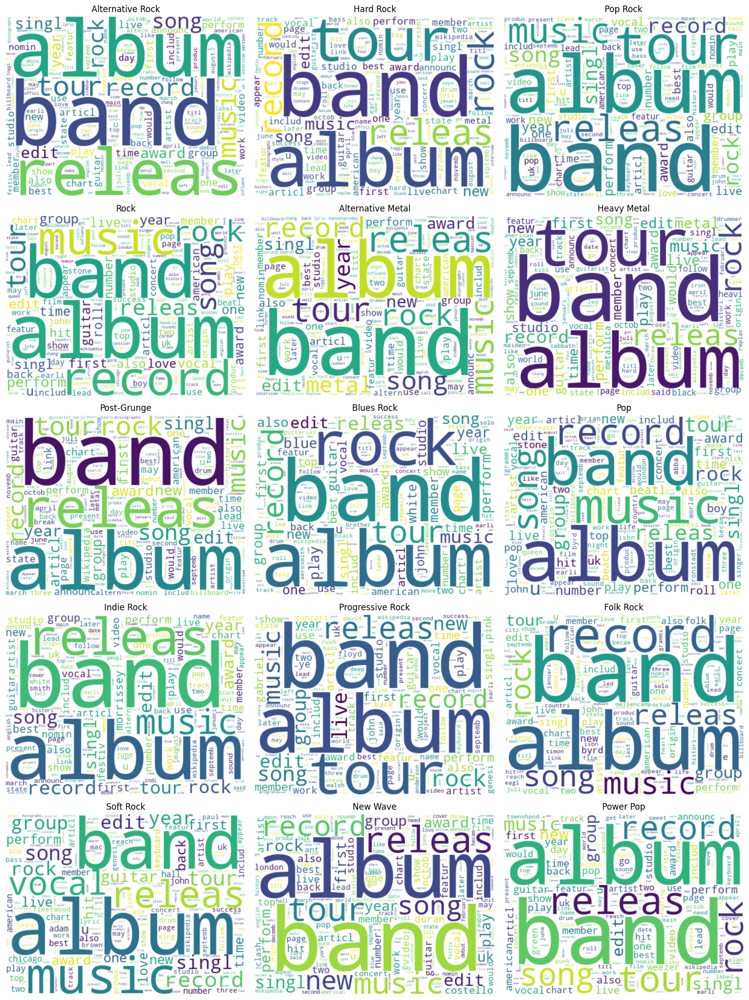

In [22]:
# Step 2: draw wordclouds for the top 15 genres (uses genre_tf and top_15_genres from previous cells)
try:
    from wordcloud import WordCloud
    import matplotlib.pyplot as plt

    num_genres = len(top_15_genres)
    cols = 3
    rows = (num_genres + cols - 1) // cols

    plt.figure(figsize=(cols * 5, rows * 4))
    for i, genre in enumerate(top_15_genres):
        if genre not in genre_tf:
            continue
        word_freq = genre_tf[genre]
        wc = WordCloud(width=400, height=300, background_color="white").generate_from_frequencies(word_freq)

        plt.subplot(rows, cols, i + 1)
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(genre.title())

    plt.tight_layout()
    plt.show()
except ImportError as e:
    print(e)
    print("WordCloud library not available; skipping wordcloud visualization.")

# Part 5: Understanding TF-IDF

Now we jump back into the NLP work. In this last part, we'll be creating word-clouds again. But this time, we'll be using the method from the paper I discuss above: TF-IDF. Historically people have had a hard time grasping the idea behind TF-IDF, so here's a little exercise designed to make you study it a bit more carefully.

*Exercise 4*: Wrap your brain around TF-IDF

First, let's learn about TF-IDF the way wikipedia explains it. Check out [the wikipedia page for TF-IDF](https://en.wikipedia.org/wiki/Tf%E2%80%93idf) and ***read the first part very carefully***. The idea is that the term frequency doesn't capture just what's special about a text. It also only captures words that are just frequent in all text. 

This is clear from the top counts in one of my lists:

```
of 
in 
and 
the 
to 
a 
is
by
was
as
ref
with
first
 ```
 
You can fix some of this by removing stop-words (as is described in the book), but it's not enough. ***We want to pull out what's special about a particular text.*** 

To focus on just what's special, TF-IDF has two components: The *term frequency* (TF) and a *weight* (IDF). The weight draws on a larger corpus of text emphasize what's special about the text we're interested in.

Further, there are some extra things going on. For example, there are multiple definitions of TF on wikipedia. Above, we just looked at the raw counts.

> *Action item*
>   * Pick one of the alternative term frequency definitions. Explain why it might sometimes be prefereable to the raw count.

Now, let's talk about the inverse document frequency.

> *Action item*
>   * What does IDF stand for? Answer in your own words.
>   * How does IDF draw on a larger corpus to extract what's special a certain text? Answer in your own words.

There are also multiple versions of IDF. Let's think about those for a moment.

> *Action items*
>   * All of the IDF versions take the log of the calculated weight. Why do you think that is?
>   * Explain why using IDF makes stopword removal less important.

<div class="alert alert-block alert-info">
The point of this exercise is to understand TF-IDF. So if there are parts of the wikipedia page you don't understand, I encourage you to ask questions to an LLM to really understand the concept. Perhaps ask it to explain TF-IDF at the level of a high-school student. Once you've done that, then answer the questions in the action items on your own.
</div>

# Part 6: Genres and TF-IDF word-clouds

**But wait a minute!** Now we have all of the ingredients for a wonderful cocktail 😎

* We have genres - descriptions of related nodes in the network. 
* And you're an expert on TF-IDF, so you can extract words that characterize a text relative to everything that's going on.
* Finally, you can create nice WordCouds!

So let's put it all together. Let's use TF-IDF and wordcoulds to build a deeper understanding of the top communities.

Thus, the aim of this final part is to create genre wordclouds for the top 15 genres based on TF-IDF. 

For each genre, create a single document for each community consisting of all the cleaned text from all members of the community. So in the end, you should have 15 documents in total.

_Exercise_: Genre Word-clouds

> * Now that we have the community-texts, let's start by grabbing the TF lists from the exercise above (you may modify to use whichever version of TF you like). 
> * Next, calculate IDF for every word in every list (use whichever version of IDF you like). 
>   * Which base logarithm did you use? Is that important?
> * We're now ready to calculate TF-IDFs. Do that for each genre. 
>   * List the 10 top words for each genre accourding to TF-IDF. Are these 10 words more descriptive of the genre than just the TF? Justify your answer.
> * Create a wordcloud for each genre.
>     * **Note**: you may have to rescale the TF-IDF weights so they make sense to the wordcloud package. Write about this issue and how you solve it.
> * Explain your creation. Do the wordclouds/TF-IDF lists enable you to understand the communities you have found (or is it just gibberish)? Justify your answer.

<div class="alert alert-block alert-info">
Overall, it's OK to use an LLM to help with the code. But do write your own answers to the questions.
</div>

*Exercise*: Community Word-clouds
> * Redo the exercise above but for the 15 largest structural communities.
> * Do the word clouds seem more meaningful than for the genres? Optional: Add nuance to your answer by considering the confusion matrix $D$ that you calculated above.

Note that this is a great way of characterizing the structural communities if you don't have genre-labels (or other labels for that matter).

<div class="alert alert-block alert-info">
Todays exercices are getting, long and involved so you can do whatever parts of this one that you like with LLMs. Maybe you can even get one to solve the whole exercise?
</div>

In [25]:
from tqdm.auto import tqdm
import glob
import re
from bs4 import BeautifulSoup
from collections import defaultdict, Counter
import string
import nltk
import os

# --- Setup NLTK stopwords ---
try:
    from nltk.corpus import stopwords
    stop_words = set(stopwords.words("english"))
except LookupError:
    nltk.download("stopwords")
    from nltk.corpus import stopwords
    stop_words = set(stopwords.words("english"))

extra_stopwords = {"retrieved", "archived", "wikipedia", "cite", "reference", "https", "http"}
stop_words |= extra_stopwords

def clean_and_tokenize_html(html_text):
    """Remove reflist, punctuation, and stopwords; return list of clean tokens."""
    soup = BeautifulSoup(html_text, "html.parser")

    # remove references section <div class="reflist">
    for div in soup.find_all("div", class_="reflist"):
        div.decompose()

    # get visible text
    text = soup.get_text(separator=" ").lower()
    text = re.sub(f"[{re.escape(string.punctuation)}]", " ", text)
    tokens = re.findall(r"\b[a-z]+\b", text)
    tokens = [t for t in tokens if t not in stop_words]
    return tokens


# --- Step 1: Aggregate cleaned text per genre ---
genre_texts = defaultdict(list)  # genre → list of tokens

files = glob.glob("../Week4/content/**/*.txt", recursive=True)
for fp in tqdm(files, desc="Processing HTML pages"):
    try:
        with open(fp, "r", encoding="utf-8") as f:
            html = f.read()
    except Exception:
        with open(fp, "r", encoding="latin-1") as f:
            html = f.read()

    soup = BeautifulSoup(html, "html.parser")

    # get artist name (same logic as before)
    title = soup.find(id="firstHeading")
    if title:
        artist_name = title.get_text(strip=True)
    else:
        artist_name = re.sub(r"- Wikipedia.*$", "", soup.title.string if soup.title else fp)
        artist_name = artist_name.strip()

    # skip artists without genre info
    if artist_name not in genres_by_artist:
        continue

    tokens = clean_and_tokenize_html(html)

    # assign the same text to each genre this artist belongs to
    for g in genres_by_artist[artist_name]:
        genre_texts[g].extend(tokens)


# --- Step 2: Keep only the top 15 genres ---
top_15_genres = [
    g for g, _ in Counter(g for lst in genres_by_artist.values() for g in lst).most_common(15)
]

genre_documents = {}
for genre in top_15_genres:
    # join tokens back into a single long string
    genre_documents[genre] = " ".join(genre_texts[genre])

# Optional: save each genre’s document to disk
os.makedirs("genre_docs", exist_ok=True)
for genre, text in genre_documents.items():
    safe_name = re.sub(r"\W+", "_", genre.lower())
    path = os.path.join("genre_docs", f"{safe_name}.txt")
    with open(path, "w", encoding="utf-8") as f:
        f.write(text)

print(f"✅ Created {len(genre_documents)} genre documents.")

Processing HTML pages: 100%|██████████| 485/485 [01:42<00:00,  4.75it/s]

✅ Created 15 genre documents.


Top 10 TF-IDF words per genre (sublinear TF, smooth natural-log IDF):

=== alternative rock ===
leto	13.6465
erlandson	13.6465
delonge	13.3365
gaugh	12.9515
maur	12.5964
sa	12.3341
kowalewicz	12.1938
schemel	12.1938
hexum	11.8921
trohman	11.8113

=== hard rock ===
scholz	16.1111
delp	14.1365
dubrow	13.4618
farner	13.1670
ehart	12.9515
livgren	12.5964
bickler	12.4840
amboy	12.3341
schacher	12.3341
sylvain	11.9604

=== pop rock ===
rea	13.3181
whitwam	12.5964
shorrock	12.0491
hopwood	12.0467
noone	12.0319
trohman	11.8113
creeggan	11.5702
leckenby	11.5568
reddick	11.5398
goble	11.2609

=== rock ===
wilbury	15.2043
doobies	13.0612
mudcrutch	12.7195
everlys	12.7195
bickler	12.4840
gibbins	12.3627
jardine	12.3147
surfin	12.2511
polley	12.1693
shorrock	12.0491

=== alternative metal ===
cheng	13.3680
kisser	13.0612
silveria	12.3341
fieldy	11.5568
munky	11.5568
skold	11.3740
eros	11.3740
casagrande	11.3740
claypool	11.3720
comalies	11.1794

=== heavy metal ===
dubrow	13.4618
mindcrime	13.0612


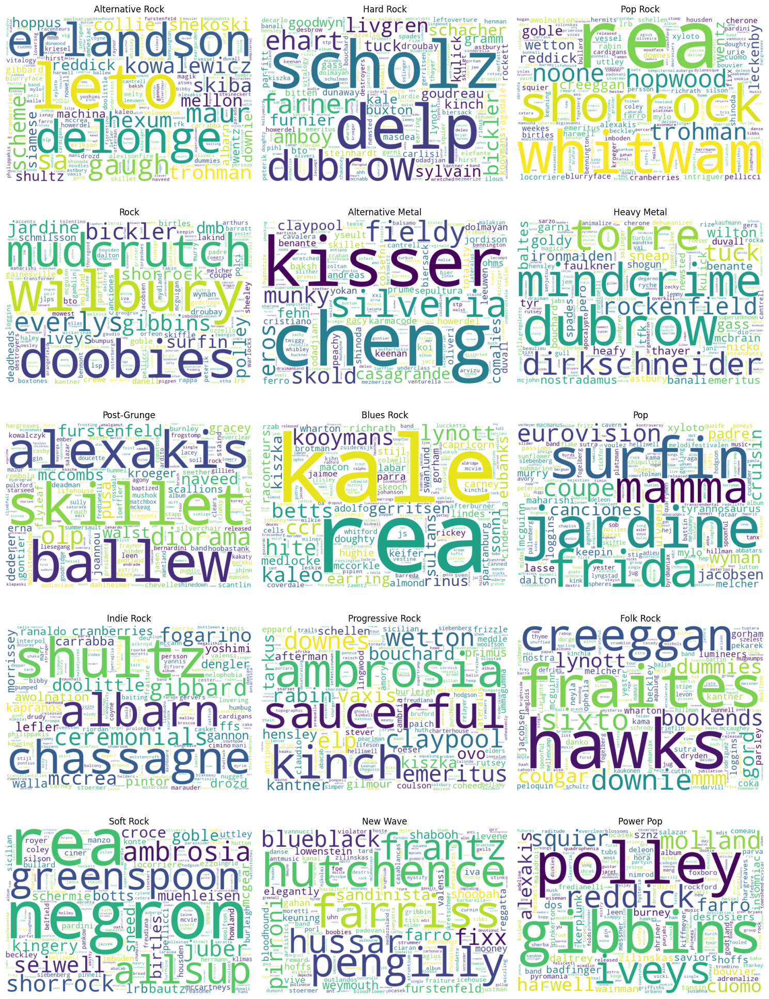

In [26]:
from collections import Counter, defaultdict
import math
from wordcloud import WordCloud

# TF-IDF wordclouds for top genres (uses variables defined in earlier cells:
# genre_texts, top_15_genres, top_15_genres, top_n etc.)
import matplotlib.pyplot as plt

# 1) Build term frequencies per-genre (Counter) from existing genre_texts
tf_by_genre = {g: Counter(genre_texts.get(g, [])) for g in top_15_genres}

# 2) Document frequency (in how many genre-docs a term appears)
N = len(top_15_genres)
df = Counter()
for g, ctr in tf_by_genre.items():
    for w in ctr:
        df[w] += 1

# 3) IDF: smooth idf: idf(w) = 1 + ln( N / (1 + df(w)) )
idf = {w: 1.0 + math.log(N / (1 + df_w),  math.e) for w, df_w in df.items()}

# 4) TF variant: sublinear tf: tf' = 1 + ln(tf)  (if tf>0), then TF-IDF = tf' * idf
tfidf_by_genre = {}
for g, ctr in tf_by_genre.items():
    tfidf = {}
    for w, raw_tf in ctr.items():
        if raw_tf <= 0:
            continue
        tf_sub = 1.0 + math.log(raw_tf, math.e)  # sublinear TF
        tfidf[w] = tf_sub * idf.get(w, 1.0)
    tfidf_by_genre[g] = tfidf

# 5) Show top 10 TF-IDF terms per genre
print("Top 10 TF-IDF words per genre (sublinear TF, smooth natural-log IDF):\n")
top_k = 10
top_terms_by_genre = {}
for g in top_15_genres:
    tfidf = tfidf_by_genre.get(g, {})
    top_terms = sorted(tfidf.items(), key=lambda x: -x[1])[:top_k]
    top_terms_by_genre[g] = top_terms
    print(f"=== {g} ===")
    for w, score in top_terms:
        print(f"{w}\t{score:.4f}")
    print()

# 6) Create wordclouds using TF-IDF weights (scaled)
try:
    cols = 3
    rows = (len(top_15_genres) + cols - 1) // cols
    plt.figure(figsize=(cols * 5, rows * 4))
    for i, g in enumerate(top_15_genres):
        freqs = tfidf_by_genre.get(g, {})
        if not freqs:
            continue
        # scale to a nicer range for WordCloud; preserve relative ordering
        max_val = max(freqs.values())
        scaled = {w: (v / max_val) * 100.0 for w, v in freqs.items()}

        wc = WordCloud(width=600, height=400, background_color="white",
                       collocations=False).generate_from_frequencies(scaled)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(g.title())
    plt.tight_layout()
    plt.show()
except Exception as e:
    print("WordCloud not available or error generating images:", e)
    print("Top terms printed above. To enable wordclouds, install the `wordcloud` package.")

# 7) Save top terms to a dict for later inspection
_top_tfidf_terms_15genres = top_terms_by_genre

scanning files: 100%|██████████| 485/485 [01:00<00:00,  7.99it/s]






































































































































































































document frequency: 100%|██████████| 8/8 [00:00<00:00, 321.38it/s]
















top terms per comm: 100%|██████████| 8/8 [00:00<00:00, 299.42it/s]


=== comm_0 (size=514684 tokens, unique=28643) ===
kantner	13.7907
dury	13.4692
ulvaeus	12.7207
balin	12.6891
gouldman	12.6571
gilmour	11.7265
hollies	11.7265
lumineers	11.7215
lyngstad	11.6733
hite	11.6241
kaukonen	11.5739
burchill	11.3616
gibbins	11.3055
sylvain	11.1890
freiberg	11.1286

=== comm_1 (size=323100 tokens, unique=20825) ===
anselmo	13.4461
scholz	12.7519
howerdel	12.1165
ellefson	11.9920
emeritus	11.9490
coheed	11.7215
hanneman	11.4165
cherone	11.3616
firehouse	11.3055
delp	11.1890
tuck	11.0666
lindemann	11.0030
ibanez	10.9376
inez	10.9376
heafy	10.9376

=== comm_2 (size=250031 tokens, unique=17810) ===
murphey	13.9271
rea	13.7091
croce	13.1766
ondrasik	12.5245
shorrock	12.3840
tork	12.0757
goble	11.5739
mcvie	11.5290
outfield	11.3055
birtles	11.2480
negron	11.0030
kirwan	10.8704
deyoung	10.8704
nesmith	10.8497
kale	10.6566

=== comm_3 (size=235080 tokens, unique=17079) ===
wentz	12.7519
delonge	12.1960
nowell	11.9490
urie	11.8151
mcilrath	11.3055
gaugh	11.3055
farro	11.1

generate wordclouds: 100%|██████████| 8/8 [00:03<00:00,  2.48it/s]


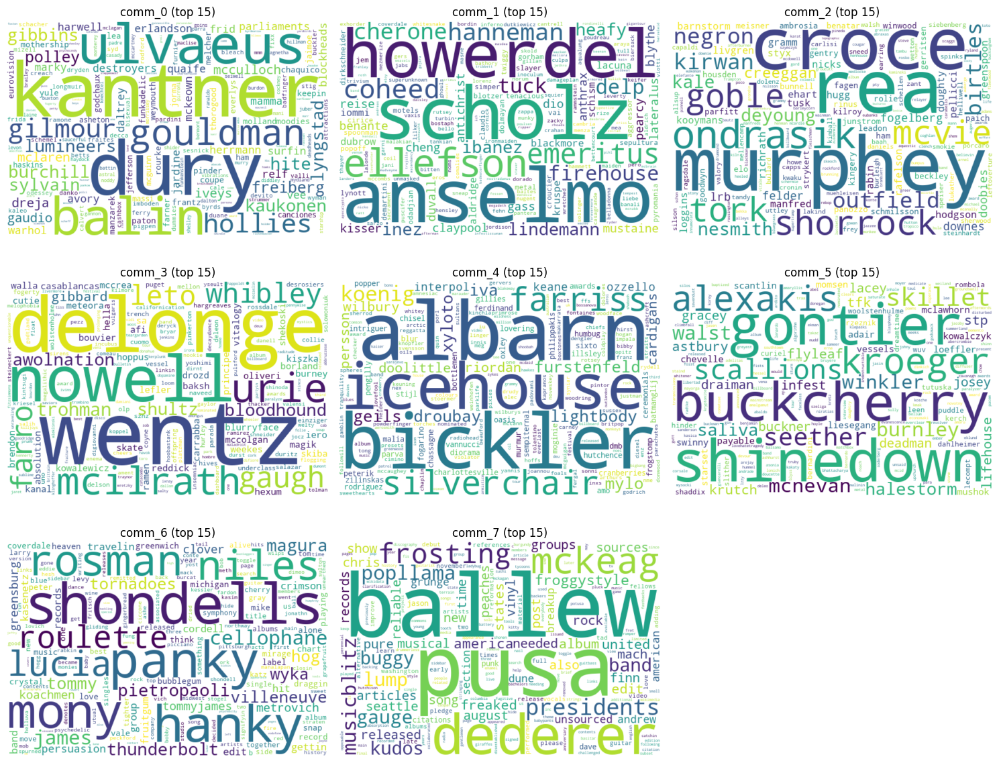

In [29]:
from collections import Counter, defaultdict
import glob, os, re
from bs4 import BeautifulSoup
import math
from networkx.algorithms.community import louvain_communities
from wordcloud import WordCloud
from tqdm import tqdm  # progress bars

# Community word-clouds for the 15 largest structural communities
# Uses notebook variables: H, node_to_artist, clean_and_tokenize_html (from earlier cells)
import matplotlib.pyplot as plt

# ensure we have Louvain communities available, else compute
try:
    comms = comms_all  # computed in earlier cell
except NameError:
    try:
        comms = louvain_comms
    except NameError:
        comms = louvain_communities(H, resolution=1, seed=42)

# take 15 largest structural communities
top_n = 15
comms_sorted = sorted(comms, key=len, reverse=True)
top_comms_15 = [list(c) for c in comms_sorted[:top_n]]

# build artist -> filepath map by scanning HTML files (robust lookup)
artist_file = {}
files = glob.glob("../Week4/content/**/*.txt", recursive=True)
for fp in tqdm(files, desc="scanning files"):
    try:
        with open(fp, "r", encoding="utf-8") as f:
            html = f.read()
    except Exception:
        with open(fp, "r", encoding="latin-1") as f:
            html = f.read()
    soup = BeautifulSoup(html, "html.parser")
    title = soup.find(id="firstHeading")
    if title and title.get_text(strip=True):
        name = title.get_text(strip=True)
    elif soup.title and soup.title.string:
        name = re.sub(r"- Wikipedia.*$", "", soup.title.string).strip()
    else:
        name = os.path.splitext(os.path.basename(fp))[0]
    artist_file[name] = fp

# helper to get tokens for an artist
def tokens_for_artist(artist_name):
    fp = artist_file.get(artist_name)
    if not fp:
        return []
    try:
        with open(fp, "r", encoding="utf-8") as f:
            html = f.read()
    except Exception:
        with open(fp, "r", encoding="latin-1") as f:
            html = f.read()
    return clean_and_tokenize_html(html)

# aggregate tokens per community
comm_tokens = {}
for i, comm in enumerate(tqdm(top_comms_15, desc="communities")):
    ctr = Counter()
    for node in tqdm(comm, desc=f"nodes in comm_{i}", leave=False):
        artist = node_to_artist.get(node)
        if not artist:
            continue
        toks = tokens_for_artist(artist)
        if toks:
            ctr.update(toks)
    comm_tokens[f"comm_{i}"] = ctr

# Build TF-IDF across the top N community documents
docs = list(comm_tokens.keys())
Ndocs = len(docs)
# Document frequency
df = Counter()
for g, ctr in tqdm(comm_tokens.items(), desc="document frequency"):
    for w in ctr:
        df[w] += 1

# IDF: smooth natural-log idf
idf = {w: 1.0 + math.log(Ndocs / (1 + df_w)) for w, df_w in df.items()}

# TF variant: sublinear (1 + ln(tf)); compute TF-IDF
tfidf_by_comm = {}
for g, ctr in tqdm(comm_tokens.items(), desc="compute tfidf"):
    tfidf = {}
    for w, raw_tf in tqdm(ctr.items(), desc=f"tf terms {g}", leave=False):
        if raw_tf <= 0:
            continue
        tf_sub = 1.0 + math.log(raw_tf)
        tfidf[w] = tf_sub * idf.get(w, 1.0)
    tfidf_by_comm[g] = tfidf

# show top 15 TF-IDF words per community
top_k = 15
top_terms_by_comm = {}
for g in tqdm(docs, desc="top terms per comm"):
    top_terms = sorted(tfidf_by_comm.get(g, {}).items(), key=lambda x: -x[1])[:top_k]
    top_terms_by_comm[g] = top_terms
    print(f"=== {g} (size={sum(comm_tokens[g].values())} tokens, unique={len(comm_tokens[g])}) ===")
    for w, s in top_terms:
        print(f"{w}\t{s:.4f}")
    print()

# WordClouds (scaled TF-IDF)
try:
    cols = 3
    rows = (len(docs) + cols - 1) // cols
    plt.figure(figsize=(cols * 5, rows * 4))
    for i, g in enumerate(tqdm(docs, desc="generate wordclouds")):
        freqs = tfidf_by_comm.get(g, {})
        if not freqs:
            continue
        max_val = max(freqs.values()) if freqs else 1.0
        scaled = {w: (v / max_val) * 100.0 for w, v in freqs.items()}
        wc = WordCloud(width=600, height=400, background_color="white", collocations=False)
        wc = wc.generate_from_frequencies(scaled)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(wc, interpolation="bilinear")
        plt.axis("off")
        plt.title(f"{g} (top {top_k})")
    plt.tight_layout()
    plt.show()
except Exception as e:
    print("WordCloud not available or error:", e)
    print("Top terms printed above.")

# expose results for later use
_comm_tokens_15 = comm_tokens
_tfidf_by_comm_15 = tfidf_by_comm
_top_terms_by_comm_15 = top_terms_by_comm